# **Import Libraries**

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
plt.style.use('seaborn')
import seaborn as sns
sns.set_style('darkgrid')
import cv2
import os
import glob as gb
import keras
from keras.models import Sequential
from keras.layers import Dense, Flatten, Conv2D, MaxPooling2D, Dropout, BatchNormalization
from keras.preprocessing.image import ImageDataGenerator
from keras.optimizers import Adam, SGD
from keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from tensorflow.keras.applications import ResNet50, VGG16
from tensorflow.keras.optimizers import Adam
import os
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
import xml.etree.ElementTree as ET

<ipython-input-1-30969f8219ff>:4: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn')


### Connect my drive

In [2]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### Call the data

In [2]:
!pip install kaggle

In [3]:
!mkdir -p ~/.kaggle
!cp /content/drive/MyDrive/kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json


In [10]:
! kaggle datasets download -d andrewmvd/face-mask-detection -p /content/drive/MyDrive/datasets

Dataset URL: https://www.kaggle.com/datasets/andrewmvd/face-mask-detection
License(s): CC0-1.0
face-mask-detection.zip: Skipping, found more recently modified local copy (use --force to force download)


In [11]:
!unzip /content/drive/MyDrive/datasets/face-mask-detection.zip -d /content/drive/MyDrive/datasets/


Archive:  /content/drive/MyDrive/datasets/face-mask-detection.zip
  inflating: /content/drive/MyDrive/datasets/annotations/maksssksksss0.xml  
  inflating: /content/drive/MyDrive/datasets/annotations/maksssksksss1.xml  
  inflating: /content/drive/MyDrive/datasets/annotations/maksssksksss10.xml  
  inflating: /content/drive/MyDrive/datasets/annotations/maksssksksss100.xml  
  inflating: /content/drive/MyDrive/datasets/annotations/maksssksksss101.xml  
  inflating: /content/drive/MyDrive/datasets/annotations/maksssksksss102.xml  
  inflating: /content/drive/MyDrive/datasets/annotations/maksssksksss103.xml  
  inflating: /content/drive/MyDrive/datasets/annotations/maksssksksss104.xml  
  inflating: /content/drive/MyDrive/datasets/annotations/maksssksksss105.xml  
  inflating: /content/drive/MyDrive/datasets/annotations/maksssksksss106.xml  
  inflating: /content/drive/MyDrive/datasets/annotations/maksssksksss107.xml  
  inflating: /content/drive/MyDrive/datasets/annotations/maksssksksss1

In [3]:
import os

dataset_dir = "/content/drive/MyDrive/datasets"
annotations_dir = os.path.join(dataset_dir, "annotations")
images_dir = os.path.join(dataset_dir, "images")

print("Annotations Directory:", os.listdir(annotations_dir)[:5])  # Display first 5 annotation files
print("Images Directory:", os.listdir(images_dir)[:5])

Annotations Directory: ['maksssksksss108.xml', 'maksssksksss1.xml', 'maksssksksss10.xml', 'maksssksksss106.xml', 'maksssksksss100.xml']
Images Directory: ['maksssksksss0.png', 'maksssksksss1.png', 'maksssksksss13.png', 'maksssksksss10.png', 'maksssksksss117.png']


**Information about my data**

In [4]:
import xml.etree.ElementTree as ET

sample_annotation = os.path.join(annotations_dir, "maksssksksss0.xml")
tree = ET.parse(sample_annotation)
root = tree.getroot()

for elem in root:
    print(elem.tag, elem.text)

for obj in root.findall("object"):
    label = obj.find("name").text
    bndbox = obj.find("bndbox")
    bbox = {
        "xmin": int(bndbox.find("xmin").text),
        "ymin": int(bndbox.find("ymin").text),
        "xmax": int(bndbox.find("xmax").text),
        "ymax": int(bndbox.find("ymax").text)
    }
    print(f"Label: {label}, BBox: {bbox}")


folder images
filename maksssksksss0.png
size 
        
segmented 0
object 
        
object 
        
object 
        
Label: without_mask, BBox: {'xmin': 79, 'ymin': 105, 'xmax': 109, 'ymax': 142}
Label: with_mask, BBox: {'xmin': 185, 'ymin': 100, 'xmax': 226, 'ymax': 144}
Label: without_mask, BBox: {'xmin': 325, 'ymin': 90, 'xmax': 360, 'ymax': 141}


### **Import My Script**

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


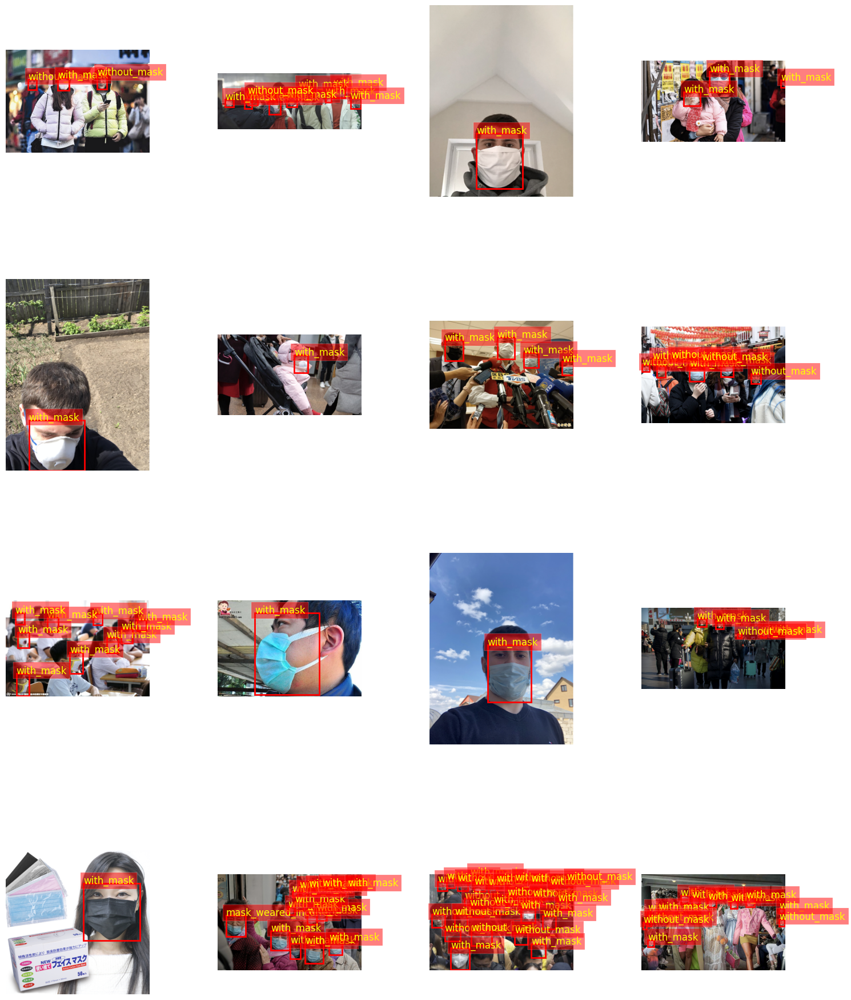

____________shape_____________


,filename,label,class_id,width,height,bboxes
0,maksssksksss108.png,with_mask,0,400,225,"[155, 29, 180, 51]"
1,maksssksksss108.png,with_mask,0,400,225,"[206, 35, 228, 58]"
2,maksssksksss108.png,with_mask,0,400,225,"[332, 67, 346, 81]"
3,maksssksksss108.png,with_mask,0,400,225,"[362, 68, 376, 82]"
4,maksssksksss108.png,without_mask,2,400,225,"[267, 72, 278, 83]"
...,...,...,...,...,...,...
4067,maksssksksss476.png,with_mask,0,400,267,"[105, 61, 129, 86]"
4068,maksssksksss476.png,with_mask,0,400,267,"[94, 116, 118, 152]"
4069,maksssksksss476.png,without_mask,2,400,267,"[286, 52, 309, 76]"
4070,maksssksksss476.png,without_mask,2,400,267,"[116, 110, 143, 138]"


_____________head_____________


,filename,label,class_id,width,height,bboxes
0,maksssksksss108.png,with_mask,0,400,225,"[155, 29, 180, 51]"
1,maksssksksss108.png,with_mask,0,400,225,"[206, 35, 228, 58]"
2,maksssksksss108.png,with_mask,0,400,225,"[332, 67, 346, 81]"
3,maksssksksss108.png,with_mask,0,400,225,"[362, 68, 376, 82]"
4,maksssksksss108.png,without_mask,2,400,225,"[267, 72, 278, 83]"


_____________tail_____________


,filename,label,class_id,width,height,bboxes
4067,maksssksksss476.png,with_mask,0,400,267,"[105, 61, 129, 86]"
4068,maksssksksss476.png,with_mask,0,400,267,"[94, 116, 118, 152]"
4069,maksssksksss476.png,without_mask,2,400,267,"[286, 52, 309, 76]"
4070,maksssksksss476.png,without_mask,2,400,267,"[116, 110, 143, 138]"
4071,maksssksksss540.png,without_mask,2,301,400,"[107, 129, 202, 245]"


_____________info_____________

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4072 entries, 0 to 4071
Data columns (total 6 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   filename  4072 non-null   object
 1   label     4072 non-null   object
 2   class_id  4072 non-null   int64 
 3   width     4072 non-null   int64 
 4   height    4072 non-null   int64 
 5   bboxes    4072 non-null   object
dtypes: int64(3), object(3)
memory usage: 191.0+ KB


None

_____describe_continuous______


,count,mean,std,min,25%,50%,75%,max
class_id,4072.000000,0.382367,0.767117,0.000000,0.000000,0.000000,0.000000,2.000000
width,4072.000000,393.702849,35.411593,193.000000,400.000000,400.000000,400.000000,600.000000
height,4072.000000,270.123772,52.340433,156.000000,226.000000,267.000000,281.000000,600.000000


_____describe_categorical_____


,count,unique,top,freq
filename,,,background-color: #a6c0ed,
label,,,background-color: #a6c0ed,
bboxes,,,,


_____null_values_percent______


filename    0.0
label       0.0
class_id    0.0
width       0.0
height      0.0
bboxes      0.0
dtype: float64

In [6]:
class_id = {
    "with_mask": 0,
    "mask_weared_incorrect": 1,
    "without_mask": 2
}
from sample_data.my_script import Preprocess
preprocessor = Preprocess(
     images_dir,
      annotations_dir,
      class_id,
      plot_images=True,
      convert_to_yolo=True,
      move_images=True,
      display_df=True
)
preprocessor()

### **Test every function**

**Explore the Images**

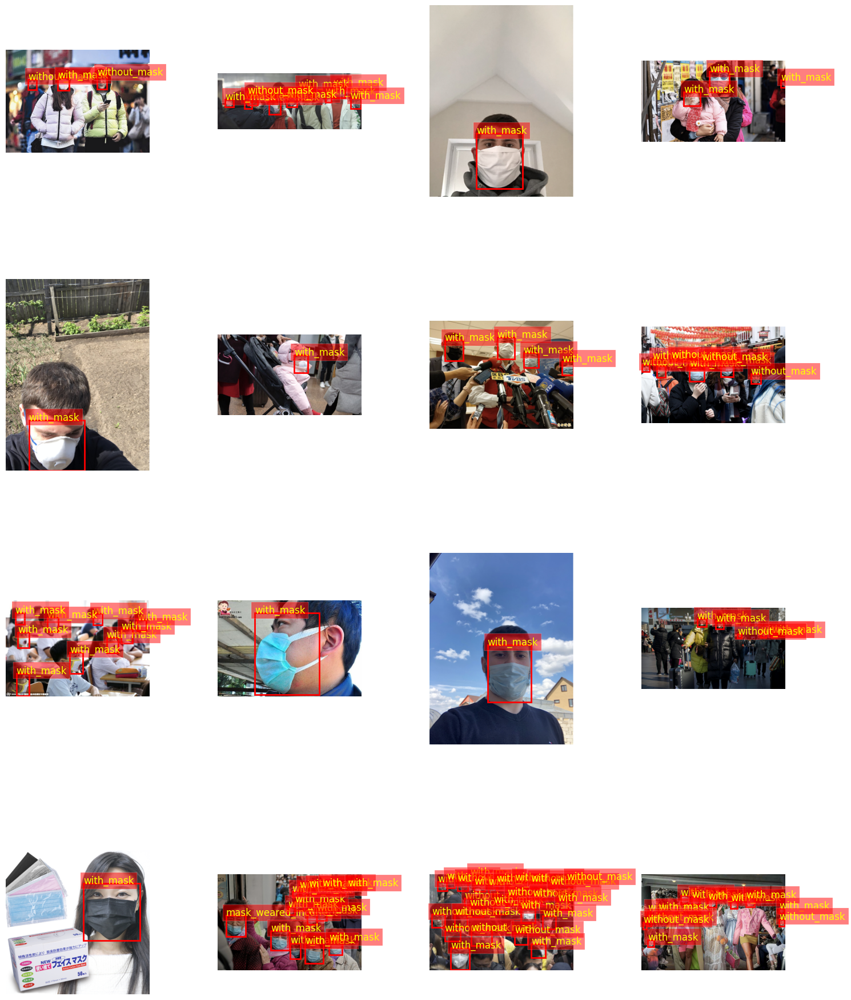

In [7]:
preprocessor.plot_multiple_images(num_images = 16)

In [8]:
from collections import Counter

class_counter = Counter()

for annotation_file in os.listdir(annotations_dir):
    annotation_path = os.path.join(annotations_dir, annotation_file)
    tree = ET.parse(annotation_path)
    root = tree.getroot()
    for obj in root.findall("object"):
        label = obj.find("name").text
        class_counter[label] += 1

print("Class Distribution:")
for cls, count in class_counter.items():
    print(f"{cls}: {count}")


Class Distribution:
with_mask: 3232
without_mask: 717
mask_weared_incorrect: 123


In [9]:
total_images = len(os.listdir(images_dir))
total_annotations = len(os.listdir(annotations_dir))
print(f"Total Images: {total_images}")
print(f"Total Annotations: {total_annotations}")

print("Class Distribution:")
for cls, count in class_counter.items():
    print(f"{cls}: {count}")


Total Images: 853
Total Annotations: 853
Class Distribution:
with_mask: 3232
without_mask: 717
mask_weared_incorrect: 123


**Let's make our dataframe**

In [8]:
df_data = preprocessor.create_annotations_dataframe()
df_data.head()

,filename,label,class_id,width,height,bboxes
0,maksssksksss108.png,with_mask,0,400,225,"[155, 29, 180, 51]"
1,maksssksksss108.png,with_mask,0,400,225,"[206, 35, 228, 58]"
2,maksssksksss108.png,with_mask,0,400,225,"[332, 67, 346, 81]"
3,maksssksksss108.png,with_mask,0,400,225,"[362, 68, 376, 82]"
4,maksssksksss108.png,without_mask,2,400,225,"[267, 72, 278, 83]"


**Explore the data**

In [11]:
preprocessor.show_df(df_data)

____________shape_____________


,filename,label,class_id,width,height,bboxes
0,maksssksksss108.png,with_mask,0,400,225,"[155, 29, 180, 51]"
1,maksssksksss108.png,with_mask,0,400,225,"[206, 35, 228, 58]"
2,maksssksksss108.png,with_mask,0,400,225,"[332, 67, 346, 81]"
3,maksssksksss108.png,with_mask,0,400,225,"[362, 68, 376, 82]"
4,maksssksksss108.png,without_mask,2,400,225,"[267, 72, 278, 83]"
...,...,...,...,...,...,...
4067,maksssksksss476.png,with_mask,0,400,267,"[105, 61, 129, 86]"
4068,maksssksksss476.png,with_mask,0,400,267,"[94, 116, 118, 152]"
4069,maksssksksss476.png,without_mask,2,400,267,"[286, 52, 309, 76]"
4070,maksssksksss476.png,without_mask,2,400,267,"[116, 110, 143, 138]"


_____________head_____________


,filename,label,class_id,width,height,bboxes
0,maksssksksss108.png,with_mask,0,400,225,"[155, 29, 180, 51]"
1,maksssksksss108.png,with_mask,0,400,225,"[206, 35, 228, 58]"
2,maksssksksss108.png,with_mask,0,400,225,"[332, 67, 346, 81]"
3,maksssksksss108.png,with_mask,0,400,225,"[362, 68, 376, 82]"
4,maksssksksss108.png,without_mask,2,400,225,"[267, 72, 278, 83]"


_____________tail_____________


,filename,label,class_id,width,height,bboxes
4067,maksssksksss476.png,with_mask,0,400,267,"[105, 61, 129, 86]"
4068,maksssksksss476.png,with_mask,0,400,267,"[94, 116, 118, 152]"
4069,maksssksksss476.png,without_mask,2,400,267,"[286, 52, 309, 76]"
4070,maksssksksss476.png,without_mask,2,400,267,"[116, 110, 143, 138]"
4071,maksssksksss540.png,without_mask,2,301,400,"[107, 129, 202, 245]"


_____________info_____________

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4072 entries, 0 to 4071
Data columns (total 6 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   filename  4072 non-null   object
 1   label     4072 non-null   object
 2   class_id  4072 non-null   int64 
 3   width     4072 non-null   int64 
 4   height    4072 non-null   int64 
 5   bboxes    4072 non-null   object
dtypes: int64(3), object(3)
memory usage: 191.0+ KB


None

_____describe_continuous______


,count,mean,std,min,25%,50%,75%,max
class_id,4072.000000,0.382367,0.767117,0.000000,0.000000,0.000000,0.000000,2.000000
width,4072.000000,393.702849,35.411593,193.000000,400.000000,400.000000,400.000000,600.000000
height,4072.000000,270.123772,52.340433,156.000000,226.000000,267.000000,281.000000,600.000000


_____describe_categorical_____


,count,unique,top,freq
filename,,,background-color: #a6c0ed,
label,,,background-color: #a6c0ed,
bboxes,,,,


_____null_values_percent______


filename    0.0
label       0.0
class_id    0.0
width       0.0
height      0.0
bboxes      0.0
dtype: float64

### **Visualization**

<ipython-input-12-1de444c5bba4>:3: UserWarning: The palette list has more values (4) than needed (3), which may not be intended.
  ax = sns.countplot(data=df_data, x='label',hue='class_id' , palette=custom_palette)


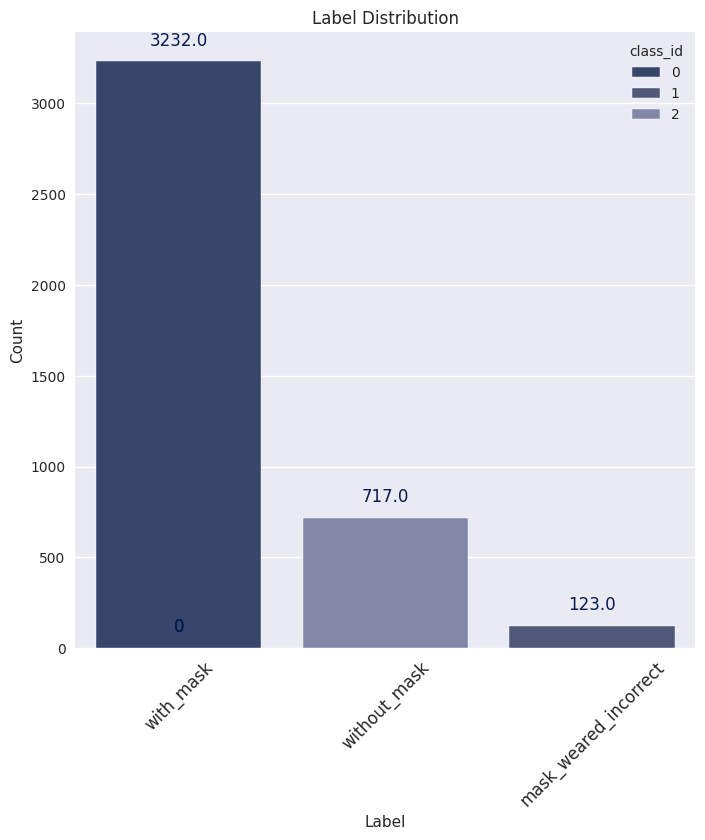

In [12]:
custom_palette = ["#2E4374",  "#4B527E" ,"#7C81AD",'#E5C3A6']
plt.figure(figsize=(8, 8))
ax = sns.countplot(data=df_data, x='label',hue='class_id' , palette=custom_palette)
plt.xlabel('Label')
plt.ylabel('Count')
plt.title('Label Distribution')

for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                 ha='center', va='center', xytext=(0, 15), textcoords='offset points', fontsize=12, color='#071952')

plt.xticks(rotation=45 ,  fontsize=12)


plt.show()

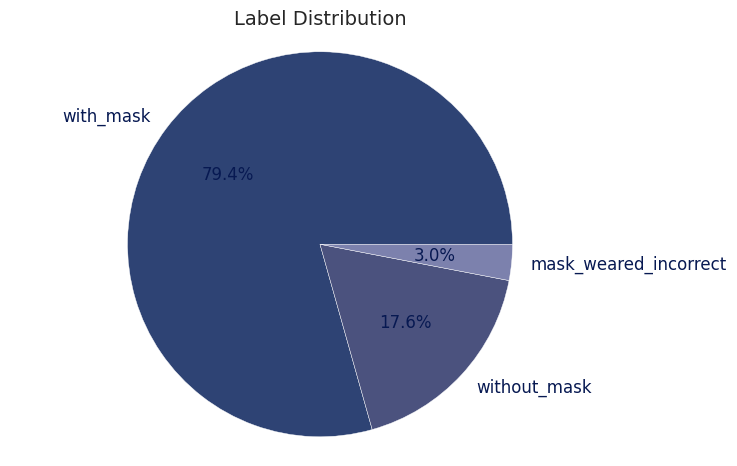

In [13]:
labels = df_data['label'].unique()
sizes = df_data['label'].value_counts().values

plt.pie(sizes, labels=labels, autopct='%1.1f%%' , colors=custom_palette , textprops={'fontsize': 12, 'color': '#071952'})
plt.title('Label Distribution' ,  fontsize=14)

plt.xticks(rotation=45 ,  fontsize=14)
plt.axis('equal')
plt.show()

### **Split data**

In [14]:
from sklearn.model_selection import train_test_split

train, test = train_test_split(df_data, test_size= .1,
                              stratify= df_data['label'],
                              random_state= 42)
train, val = train_test_split(df_data, test_size= .2,
                              stratify= df_data['label'],
                              random_state= 42)

In [15]:
print(f"Total Images: {len(train)}")
print(f"Total without_mask labels: {sum(train.label == 'without_mask')}")
print(f"Total mask_weared_incorrect labels: {sum(train.label == 'mask_weared_incorrect')}")
print(f"Total with_mask labels: {sum(train.label == 'with_mask')}")

Total Images: 3257
Total without_mask labels: 574
Total mask_weared_incorrect labels: 98
Total with_mask labels: 2585


In [16]:
print(f"Total Images: {len(val)}")
print(f"Total 'without_mask' labels: {sum(val.label == 'without_mask')}")
print(f"Total 'mask_weared_incorrect' labels: {sum(val.label == 'mask_weared_incorrect')}")
print(f"Total 'with_mask' labels: {sum(val.label == 'with_mask')}")

Total Images: 815
Total 'without_mask' labels: 143
Total 'mask_weared_incorrect' labels: 25
Total 'with_mask' labels: 647


In [ ]:
print(f"Total Images: {len(test)}")
print(f"Total 'without_mask' labels: {sum(test.label == 'without_mask')}")
print(f"Total 'mask_weared_incorrect' labels: {sum(test.label == 'mask_weared_incorrect')}")
print(f"Total 'with_mask' labels: {sum(test.label == 'with_mask')}")

### **Convert to YOLO Format**

In [18]:
preprocessor.convert_and_save_yolo()
preprocessor.move_images_to_dirs()

### **Creat YAML File**

In [9]:
classes = list(df_data.label.unique())
class_count = len(classes)
train_config_yaml = f"""
train: train
val: val
test: test
nc: 3
names:
    0: with_mask
    1: mask_weared_incorrect
    2: without_mask
"""

with open('train_config.yaml', 'w') as f:
    f.write(train_config_yaml)

# Display the contents of the YAML file to verify
with open('train_config.yaml', 'r') as f:
    print(f.read())



train: train
val: val
test: test
nc: 3
names:
    0: with_mask
    1: mask_weared_incorrect
    2: without_mask



## **Install YOLO Model**

In [10]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 757.0/757.0 kB 11.1 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.19.3-py3-none-manylinux1_x86_64.whl (166.0 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-man

# **Let's Train Our model**

In [11]:
from ultralytics import YOLO

# Load a pretrained YOLO model
model = YOLO("yolov8n.pt")  # Choose the YOLO version here, e.g., yolov8s.pt, yolov8m.pt, etc.

# Train the model with extra parameters
model.train(
    data="/content/train_config.yaml",
    epochs=10,
    lr0=0.01,
    lrf=0.1,
    batch=16,
    imgsz=640,
    workers=4,
    name='yolov8_custom',
    save_period=10,
    project='runs/train',
    optimizer='Adam',
    augment=True,
    patience=5
)


100%|██████████| 6.23M/6.23M [00:00<00:00, 70.7MB/s]


Ultralytics YOLOv8.2.17 🚀 Python-3.10.12 torch-2.2.1+cu121 CPU (Intel Xeon 2.20GHz)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/train_config.yaml, epochs=10, time=None, patience=5, batch=16, imgsz=640, save=True, save_period=10, cache=False, device=None, workers=4, project=runs/train, name=yolov8_custom, exist_ok=False, pretrained=True, optimizer=Adam, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=True, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=Tru

100%|██████████| 755k/755k [00:00<00:00, 14.6MB/s]

Overriding model.yaml nc=80 with nc=3

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                


  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  8                  -1  1    460288  ultralytics.nn.modules.block.C2f             [256, 256, 1, True]           
  9                  -1  1    164608  ultralytics.nn.modules.block.SPPF            [256, 256, 5]                 
 10                  -1  1         0  torch.nn.modules.upsampling.Upsample         [None, 2, 'nearest']          
 11             [-1, 6]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           
 12                  -1  1    148224  ultralytics.nn.modules.block.C2f             [384,

train: Scanning /content/train/labels... 777 images, 0 backgrounds, 0 corrupt: 100%|██████████| 777/777 [00:06<00:00, 120.46it/s]

train: New cache created: /content/train/labels.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/val/labels... 416 images, 0 backgrounds, 0 corrupt: 100%|██████████| 416/416 [00:03<00:00, 129.27it/s]

val: New cache created: /content/val/labels.cache


Plotting labels to runs/train/yolov8_custom/labels.jpg... 
optimizer: Adam(lr=0.01, momentum=0.937) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to runs/train/yolov8_custom
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10         0G      1.718       3.09      1.545          7        640: 100%|██████████| 49/49 [12:33<00:00, 15.38s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [02:05<00:00,  9.66s/it]

                   all        416        416   0.000406      0.101   0.000279   7.74e-05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10         0G      1.664      2.462      1.531          9        640: 100%|██████████| 49/49 [12:46<00:00, 15.65s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/13 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   8%|▊         | 1/13 [00:10<02:06, 10.52s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  15%|█▌        | 2/13 [00:20<01:49,  9.93s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  23%|██▎       | 3/13 [00:33<01:56, 11.61s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  31%|███       | 4/13 [00:44<01:42, 11.40s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  38%|███▊      | 5/13 [00:54<01:27, 10.97s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  46%|████▌     | 6/13 [01:06<01:18, 11.14s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  54%|█████▍    | 7/13 [01:18<01:08, 11.49s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  62%|██████▏   | 8/13 [01:29<00:56, 11.27s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  69%|██████▉   | 9/13 [01:40<00:44, 11.16s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  77%|███████▋  | 10/13 [01:53<00:35, 11.74s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [02:29<00:00, 11.49s/it]

                   all        416        416     0.0149     0.0279    0.00182   0.000647



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10         0G      1.634      2.322      1.526          8        640: 100%|██████████| 49/49 [12:31<00:00, 15.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [01:50<00:00,  8.53s/it]

                   all        416        416    0.00932      0.163     0.0139    0.00585



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10         0G      1.525      2.158       1.43          9        640: 100%|██████████| 49/49 [12:32<00:00, 15.36s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [01:41<00:00,  7.77s/it]

                   all        416        416      0.362      0.154     0.0227      0.011



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10         0G      1.481      2.104       1.41          9        640: 100%|██████████| 49/49 [12:30<00:00, 15.32s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [02:03<00:00,  9.51s/it]

                   all        416        416      0.628     0.0744     0.0799     0.0483



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10         0G      1.385      1.958      1.339          9        640: 100%|██████████| 49/49 [14:26<00:00, 17.69s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [02:16<00:00, 10.52s/it]

                   all        416        416      0.772      0.114      0.149     0.0976



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10         0G       1.32      1.813      1.282          6        640: 100%|██████████| 49/49 [12:38<00:00, 15.47s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [01:44<00:00,  8.07s/it]

                   all        416        416      0.558      0.149      0.168      0.111



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10         0G      1.292      1.713      1.272          9        640: 100%|██████████| 49/49 [12:11<00:00, 14.93s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [01:38<00:00,  7.58s/it]

                   all        416        416       0.51      0.203      0.175      0.118



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10         0G      1.234       1.63      1.238          9        640: 100%|██████████| 49/49 [12:13<00:00, 14.97s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [01:39<00:00,  7.68s/it]

                   all        416        416      0.552      0.169      0.188       0.13



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10         0G      1.187      1.609      1.192          9        640: 100%|██████████| 49/49 [12:05<00:00, 14.80s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [01:37<00:00,  7.50s/it]

                   all        416        416      0.533      0.191      0.188      0.132



10 epochs completed in 2.432 hours.
Optimizer stripped from runs/train/yolov8_custom/weights/last.pt, 6.2MB
Optimizer stripped from runs/train/yolov8_custom/weights/best.pt, 6.2MB

Validating runs/train/yolov8_custom/weights/best.pt...
Ultralytics YOLOv8.2.17 🚀 Python-3.10.12 torch-2.2.1+cu121 CPU (Intel Xeon 2.20GHz)
Model summary (fused): 168 layers, 3006233 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [03:47<00:00, 17.53s/it]


                   all        416        416      0.578      0.171      0.194      0.135
             with_mask        416        330      0.521      0.221      0.318      0.209
 mask_weared_incorrect        416         14          1          0     0.0133    0.00827
          without_mask        416         72      0.214      0.292      0.249      0.189
Speed: 4.1ms preprocess, 517.7ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to runs/train/yolov8_custom


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7910627992d0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.04

In [12]:
model.val(data="/content/train_config.yaml")

Ultralytics YOLOv8.2.17 🚀 Python-3.10.12 torch-2.2.1+cu121 CPU (Intel Xeon 2.20GHz)
Model summary (fused): 168 layers, 3006233 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /content/val/labels.cache... 416 images, 0 backgrounds, 0 corrupt: 100%|██████████| 416/416 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [03:48<00:00,  8.80s/it]


                   all        416        416      0.577      0.171      0.193      0.134
             with_mask        416        330      0.519      0.221      0.318      0.209
 mask_weared_incorrect        416         14          1          0      0.013     0.0082
          without_mask        416         72      0.212      0.292      0.249      0.185
Speed: 2.2ms preprocess, 521.2ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to runs/train/yolov8_custom2


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7910701c86a0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.04

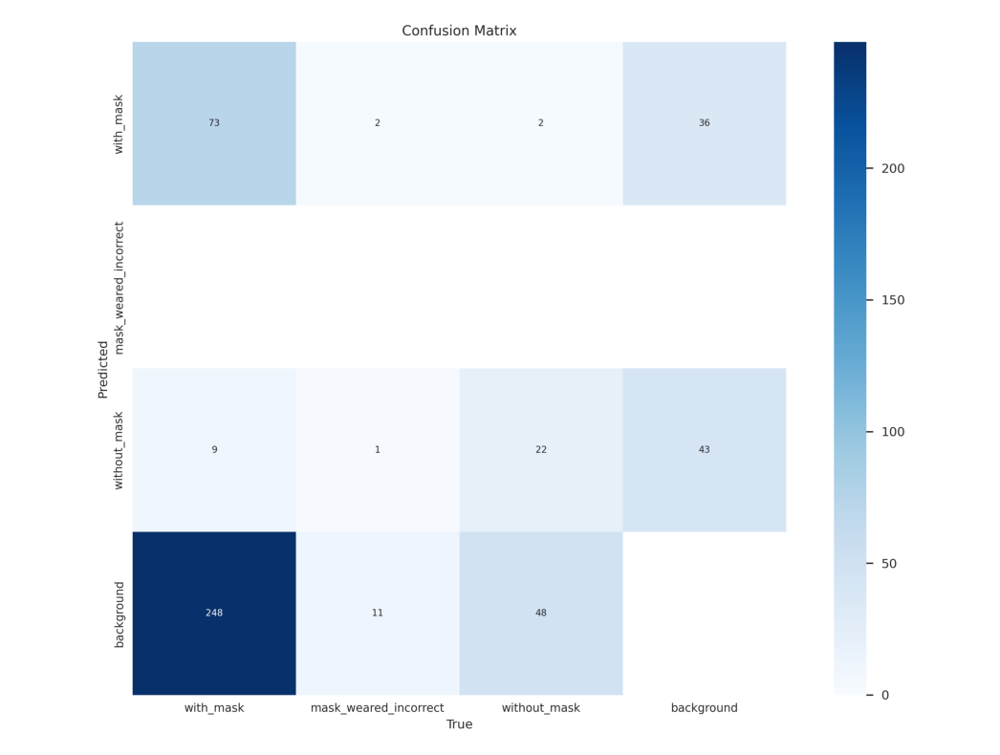

In [14]:
confusion_matrix = Image.open("/content/runs/train/yolov8_custom/confusion_matrix.png") # ตรง /kaggle/working/runs/detect/train อย่าลืมดูดีๆนะบางทีกด train 2 รอบ โมเดลปัจจุบันเราจะไปอยู่ folder train2 นะ
plt.figure(figsize=(20,10))
plt.imshow(confusion_matrix)
plt.axis(False)
plt.show()

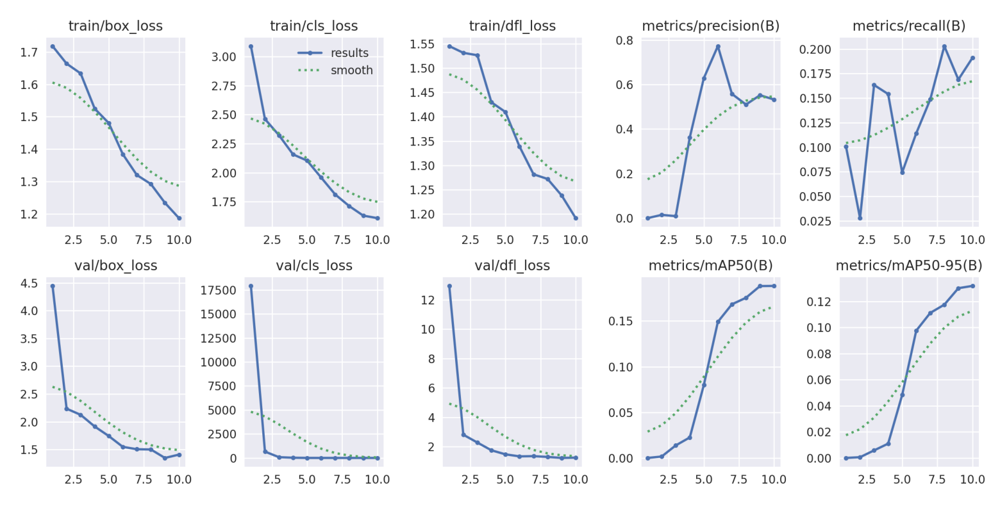

In [15]:
results = Image.open("/content/runs/train/yolov8_custom/results.png") # Don't forget to look at folder train as well.
plt.figure(figsize=(20,10))
plt.imshow(results)
plt.axis(False)
plt.show()

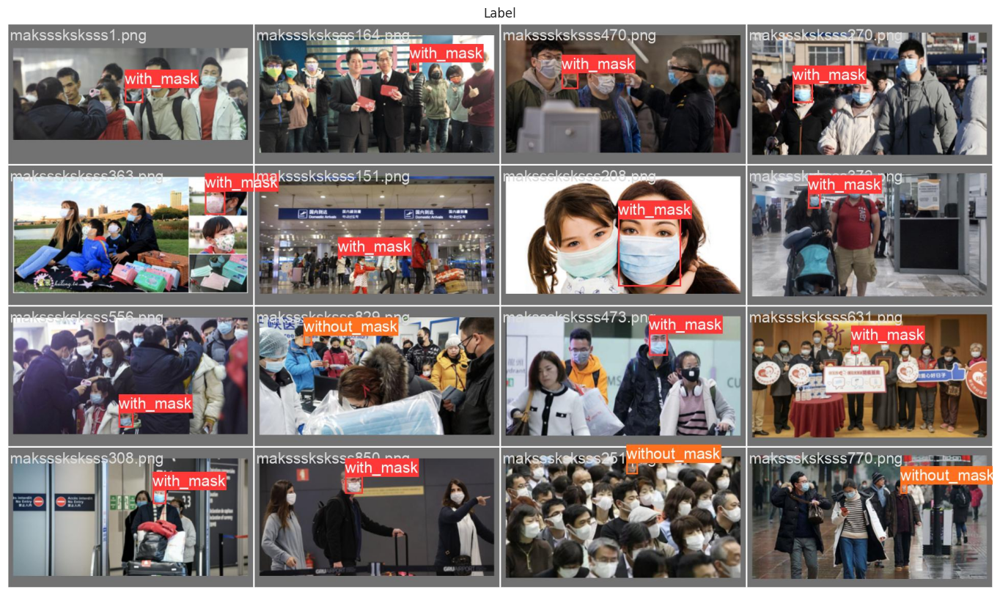

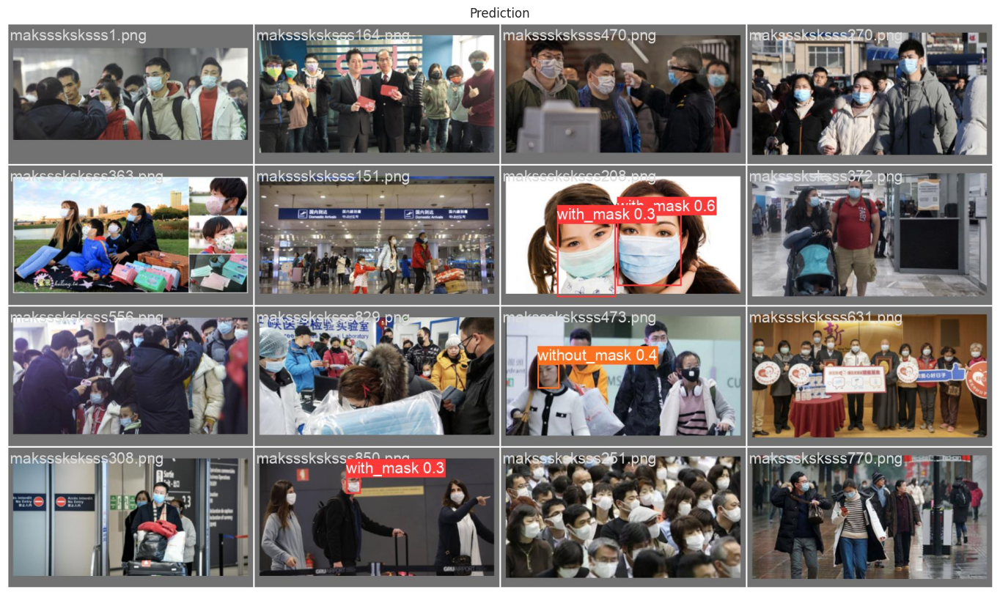

In [16]:
val_label = Image.open("/content/runs/train/yolov8_custom/val_batch0_labels.jpg") # อย่าลืมดู folder train ด้วย
val_pred = Image.open("/content/runs/train/yolov8_custom/val_batch0_pred.jpg") # อย่าลืมดู folder train ด้วย

plt.figure(figsize=(20,10))
plt.imshow(val_label)
plt.title("Label")
plt.axis(False)
plt.show()

plt.figure(figsize=(20,10))
plt.imshow(val_pred)
plt.title("Prediction")
plt.axis(False)
plt.show()

In [17]:
model = YOLO(model="/content/runs/train/yolov8_custom/weights/best.pt")

In [21]:
import glob
filenames = glob.glob("/content/test/images"+"/*.png", recursive=False)
test_image2 = cv2.imread(filenames[1])

results = model.predict([test_image2], save=True, line_thickness=1)

WARNING ⚠️ 'line_thickness' is deprecated and will be removed in 'ultralytics 8.399999999999999' in the future. Please use 'line_width' instead.

0: 640x640 (no detections), 278.5ms
1: 640x640 3 without_masks, 278.5ms
Speed: 5.2ms preprocess, 278.5ms inference, 5.4ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict


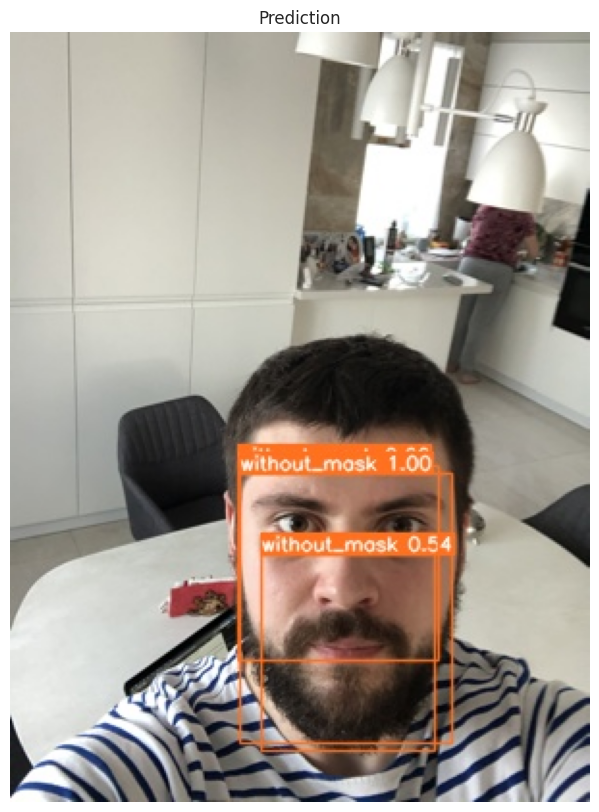

In [23]:
predicted_image = Image.open("runs/detect/predict/image1.jpg")
plt.figure(figsize=(10,10))
plt.imshow(predicted_image)
plt.title("Prediction")
plt.axis(False)
plt.show()

# **Consultion**

**The model performs well, but it needs more iterations to fit the data optimally. Ideally, we should run 100 iterations, but due to time constraints, we decided to run just 10 iterations for now.**